In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'font.size': 26,
                    'figure.max_open_warning': 200})
from matplotlib.patches import Circle
import numpy as np
import pandas as pd
import urllib.request

from date_utils import readable_date, get_date_format, dates, readable_dates

In [2]:
# Load Data.
# Thanks to the Covid Tracking Project for collecting excellent data.
url = 'http://covidtracking.com/api/states/daily.csv'
urllib.request.urlretrieve(url, 'Data/states-daily.csv')
df = pd.read_csv("Data/states-daily.csv", sep=',', header=0)
df_vals = df.values
df.head()

,date,state,positive,negative,pending,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,inIcuCumulative,onVentilatorCurrently,...,posNeg,deathIncrease,hospitalizedIncrease,hash,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade
0,20200719,AK,2277.0,170733.0,NaN,27.0,NaN,NaN,NaN,1.0,...,173010,0,0,debaefd876cd41580e56dcdfb8d1236f199234ad,0,0,0,0,0,NaN
1,20200719,AL,67011.0,518522.0,NaN,920.0,7782.0,NaN,988.0,NaN,...,585533,1,0,ce839753e3bc15208342dc3d5e752e688a253d3f,0,0,0,0,0,NaN
2,20200719,AR,32533.0,386638.0,NaN,453.0,2177.0,NaN,NaN,97.0,...,419171,4,42,ae652c2d741b8dba704a7c72d73a7624adb87c36,0,0,0,0,0,NaN
3,20200719,AS,0.0,1037.0,NaN,NaN,NaN,NaN,NaN,NaN,...,1037,0,0,2817307a95cedfb97d738e8ac12781b6eab3a68c,0,0,0,0,0,NaN
4,20200719,AZ,143624.0,642355.0,NaN,3136.0,6632.0,894.0,NaN,622.0,...,785979,31,65,6e27ea407602ba5976a2a5a08f420716a96509d5,0,0,0,0,0,NaN


In [3]:
abbrevs_df = pd.read_csv("Data/state_abbreviations.csv", sep=',', header=0)
state_abbrevs = {
    state : abbrev for [state, abbrev] in abbrevs_df.values
}
state_full_names = {
    abbrev: state for [state, abbrev] in abbrevs_df.values
}
# Population data from:
# Table 1. Annual Estimates of the Resident Population for the United States, Regions, States, and Puerto Rico: April 1, 2010 to July 1, 2019 (NST-EST2019-01)
census_df = pd.read_csv("Data/state_populations.csv", sep=',', header=None)
state_pops = {
    state_abbrevs[state].replace(' ', '_'): int(pop.replace(',', '')) for [state, pop] in census_df.values
}

size_df = pd.read_csv("Data/state_sizes.csv", sep=',', header=None)
state_sizes = {
    state_abbrevs[state].replace(' ', '_'): size for [state, size] in size_df.values
}

In [4]:
# Helper functions to read the dataframe.
def get_idx(state, date):
    i = np.where(df_vals[:, df.columns.tolist().index('state')] == state)[0]
    j = np.where(df_vals[:, df.columns.tolist().index('date')] == date)[0]
    return set(i).intersection(set(j)).pop()
    
def get_val(state, date, col_name):
    idx = get_idx(state, date)
    return df[[col_name]].values[idx]

def get_positive(state, date):
    return get_val(state, date, 'positiveIncrease')[0]

def get_negative(state, date):
    return get_val(state, date, 'negativeIncrease')[0]

def get_positive_cum(state, date):
    return get_val(state, date, 'positive')

def get_negative_cum(state, date):
    return get_val(state, date, 'negative')

def get_total(state, date):
    return get_val(state, date, 'totalTestResultsIncrease')

def get_hospitalized(state, date):
    return get_val(state, date, 'hospitalizedCurrently')

In [5]:
# Estimate c(t) based on seroloprevalence studies.
def calc_c(N, n_p, n_n, Z):
    return ((N*n_p) / (Z*n_n) - (n_p / n_n))

def calc_c_for_state_and_date(state, date, Z):
    N = state_pops[state]
    n_p = get_positive_cum(state, date)[0]
    n_n = get_negative_cum(state, date)[0]
    return calc_c(N, n_p, n_n, Z)
easy_date = lambda x: dates[readable_dates.index(x)]

# NY Study
c_ny1 = calc_c_for_state_and_date("NY", easy_date("4/21"), 0.139*state_pops["NY"]) 
c_ny2 = calc_c_for_state_and_date("NY", easy_date("5/2"), 0.123*state_pops["NY"])
print("NY1: {:.1f}, NY2: {:.1f}".format(c_ny1, c_ny2))

# ID study
c_idaho = calc_c_for_state_and_date("ID", easy_date("4/25"), 0.0179*state_pops["ID"])
print("ID: {:.1f}".format(c_idaho))

# Santa Clara - Manually coding the county population since it isn't included in the file of state populations.
pop_sc = 1928000 # Santa Clara county population
pos_sc = 1148
neg_sc = 10912

# SC-B
# Zs from Santa Clara seroprevalence study with original analysis
scb_min = 0.018*pop_sc
scb_max = 0.057*pop_sc
c_scb_min = calc_c(pop_sc, pos_sc, neg_sc, scb_min)
c_scb_max = calc_c(pop_sc, pos_sc, neg_sc, scb_max)
print("SC-B (2.5%): {:.1f}, SC-B (97.5%): {:.1f}".format(c_scb_min, c_scb_max))

# SC-S
# Zs from Santa Clara seroprevalence study with Steinberg's correction
scs_min = 0.00094*pop_sc 
scs_max = 0.0167*pop_sc
scs_mean = 0.0081*pop_sc
c_scs_min = calc_c(pop_sc, pos_sc, neg_sc, scs_min)
c_scs_max = calc_c(pop_sc, pos_sc, neg_sc, scs_max)
print("SC-S (2.5%): {:.1f}, SC-S (97.5%): {:.1f}".format(c_scs_min, c_scs_max))

NY1: 3.9, NY2: 3.5
ID: 5.8
SC-B (2.5%): 5.7, SC-B (97.5%): 1.7
SC-S (2.5%): 111.8, SC-S (97.5%): 6.2


In [6]:
# Shared plotting helpers.
markers = ['.', '+', '*', '^']

def finalize_plot(dates, y_label, fname, separate_legend=True, extension="pdf", smoothing_len=0):
    readable_dates = list(map(readable_date, dates))
    plt.xlim([smoothing_len, len(dates)-1])
    locs, labels = plt.xticks()
    locs = locs[:-1]
    plt.xticks(locs, [readable_dates[int(i)] for i in locs], fontsize=28)
    plt.xlabel("Date", fontsize=40)
    ax = plt.gca()
    ax.set_yscale('log')
    plt.ylabel(y_label, fontsize=40)
    plt.yticks(fontsize=28)
    plt.gca().set_ylim(bottom=1)
    if not separate_legend:
        lgd = plt.legend(bbox_to_anchor=(1.0, 0.9), fontsize=22)
        plt.savefig(fname, dpi=300, bbox_inches='tight', bbox_artists=[lgd])
    else:
        plt.savefig(fname, dpi=300, bbox_inches='tight')
        lgd = plt.legend(bbox_to_anchor=(1.0, 0.9), fontsize=22)
        def export_legend(legend, filename):
            fig  = legend.figure
            fig.canvas.draw()
            bbox  = legend.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
            bbox.x0 *= 0.99
            bbox.y0 *= 0.9
            bbox.y1 *= 1.02
            bbox.x1 *= 1.01
            fig.savefig(filename, dpi=300, bbox_inches=bbox)
        export_legend(lgd, "results/legend.{}".format(extension))
    
def plot_pos_neg_pop(state, dates):
    positives = np.array([get_positive(state, date) for date in dates]).astype(np.float)
    positives[positives < 2] = np.nan # won't plot
    negatives = np.array([get_negative(state, date) for date in dates]).astype(np.float)
    negatives[negatives < 2] = np.nan # won't plot
    hospitalized = np.array([get_hospitalized(state, date) for date in dates])
    pop = np.array([state_pops[state] for date in dates])
    plt.plot(pop, label='State Population', color='black')#, marker='+')
    plt.plot(positives, label='Daily Positive Tests', color='red', marker='+')
    plt.plot(negatives, label='Daily Negative Tests', color='green', marker='+')
    plt.plot(hospitalized, label='Current Hospitalized', color='blue', marker='+')

In [7]:
# The main part of the model to estimate total number of infections.
all_latent_totals = {}
def get_latent_total(state, date, c):
    try:
        return all_latent_totals[(state, date, c)]
    except KeyError:
        ans = (state_pops[state]/14)*float(get_positive(state, date)) / (get_negative(state, date)*c + get_positive(state, date))
        all_latent_totals[(state, date, c)] = ans
        return ans

In [8]:
def finite_mean(x):
    return np.nanmean(x[np.isfinite(x)])

all_latent = {}
def get_smoothed_latent(state, j, date, dates, c_key, smoothing_len=7):
    try:
        return all_latent[(state, j, date, c_key)]
    except KeyError:
        totals = []
        for k, d in enumerate(dates[j-smoothing_len+1:j+1]):
            if get_positive(state, d) > 5 and get_negative(state, d) > 5:
                totals.append(get_latent_total(state, d, c_key))
        ans = finite_mean(np.array(totals))
        all_latent[(state, j, date, c_key)] = ans
        return ans

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Libra

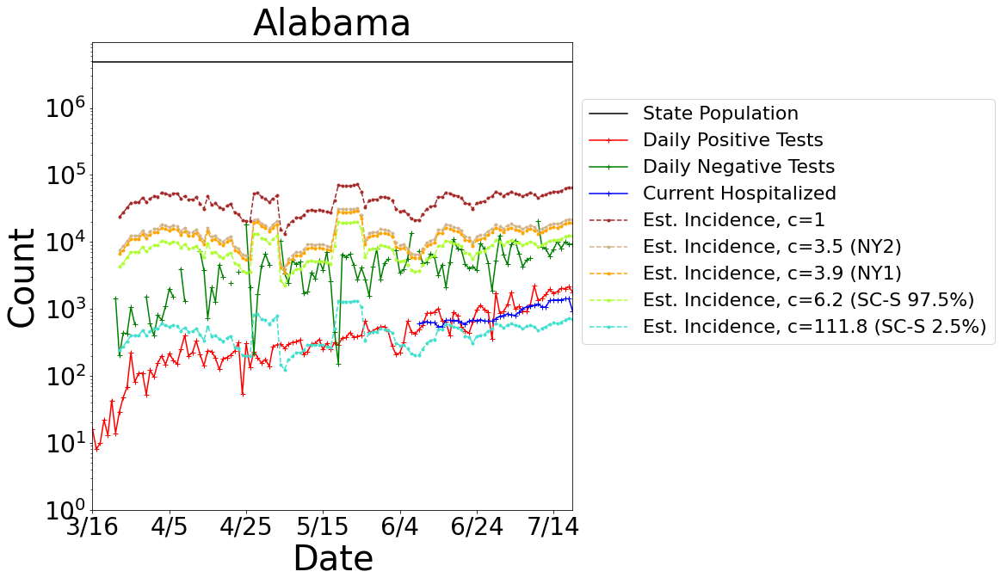

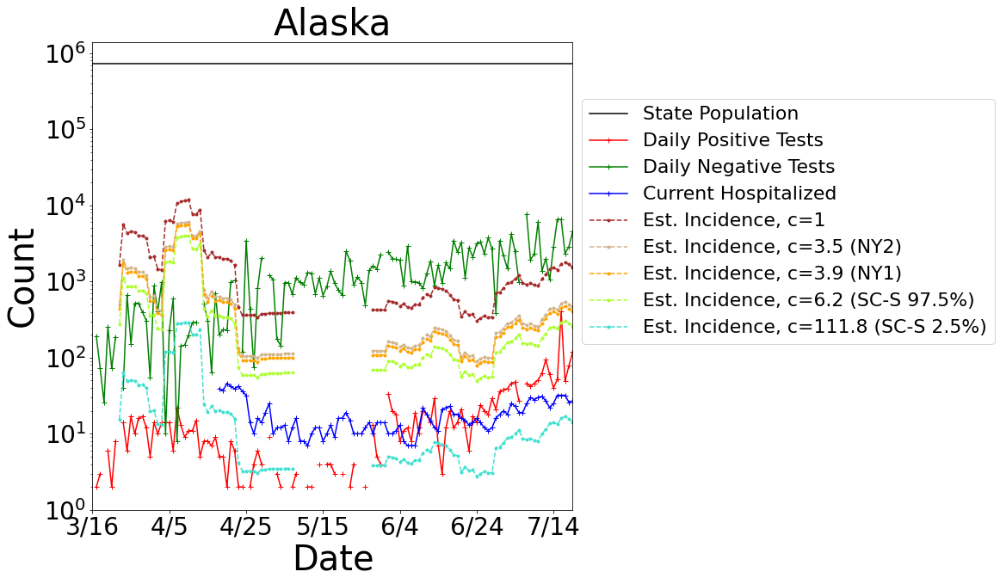

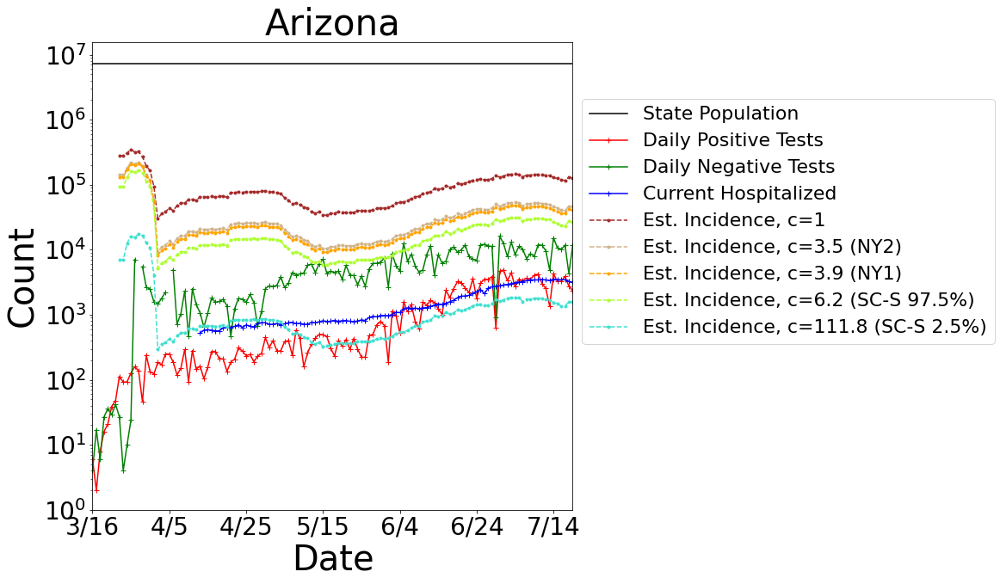

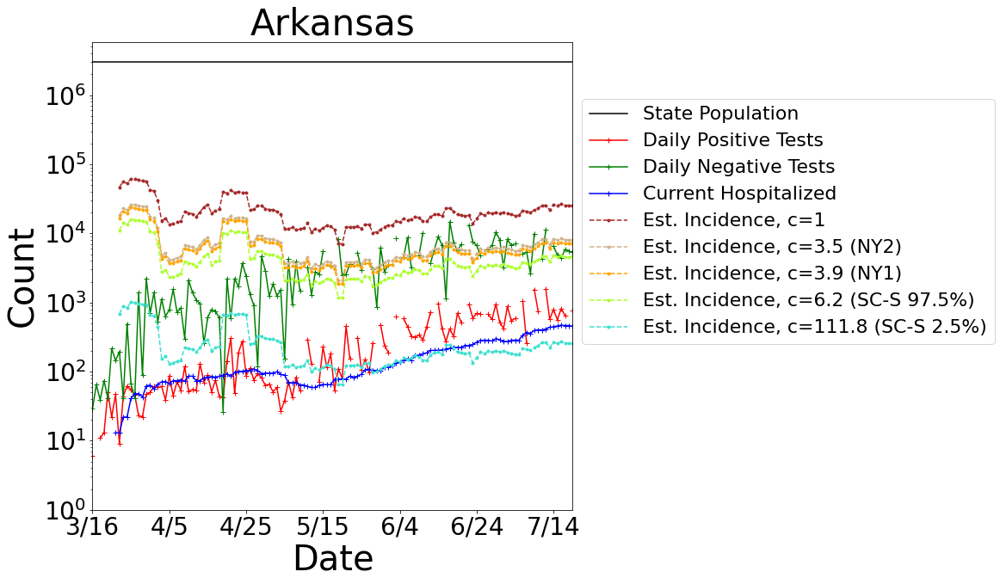

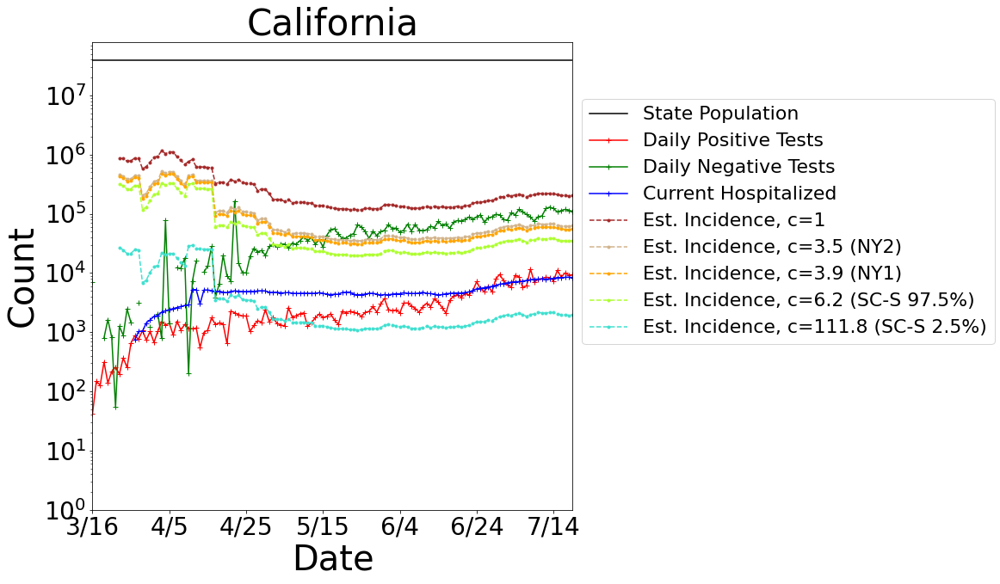

...

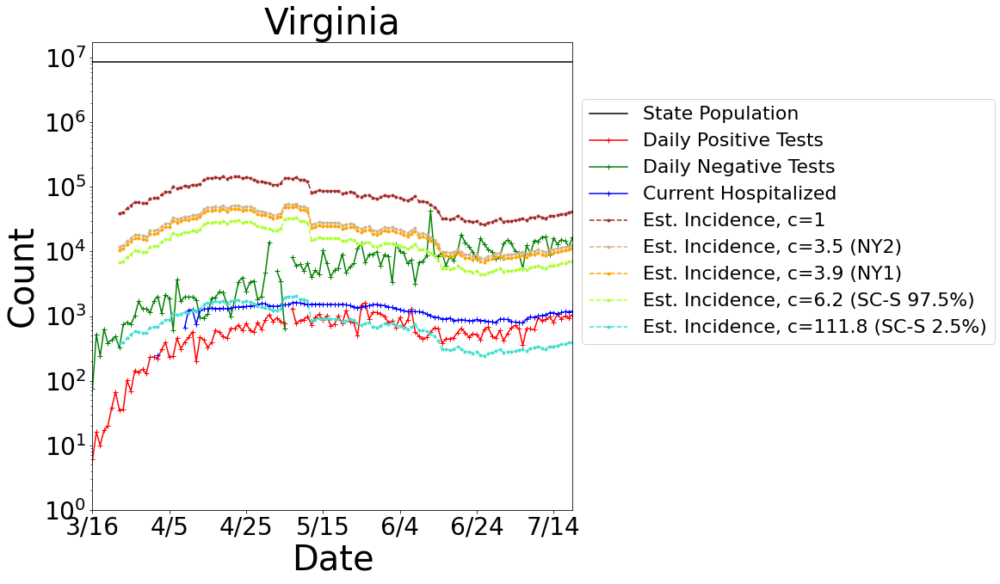

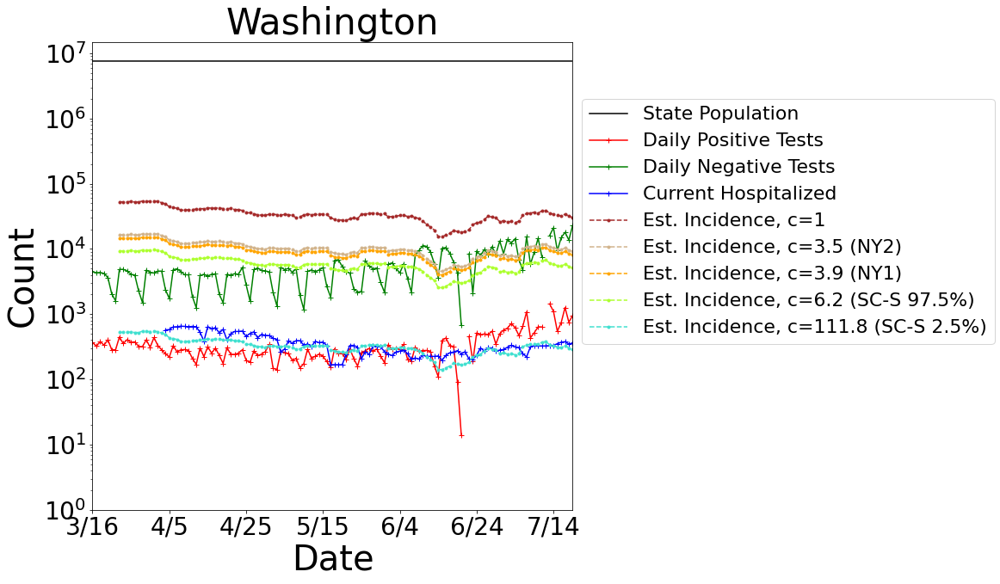

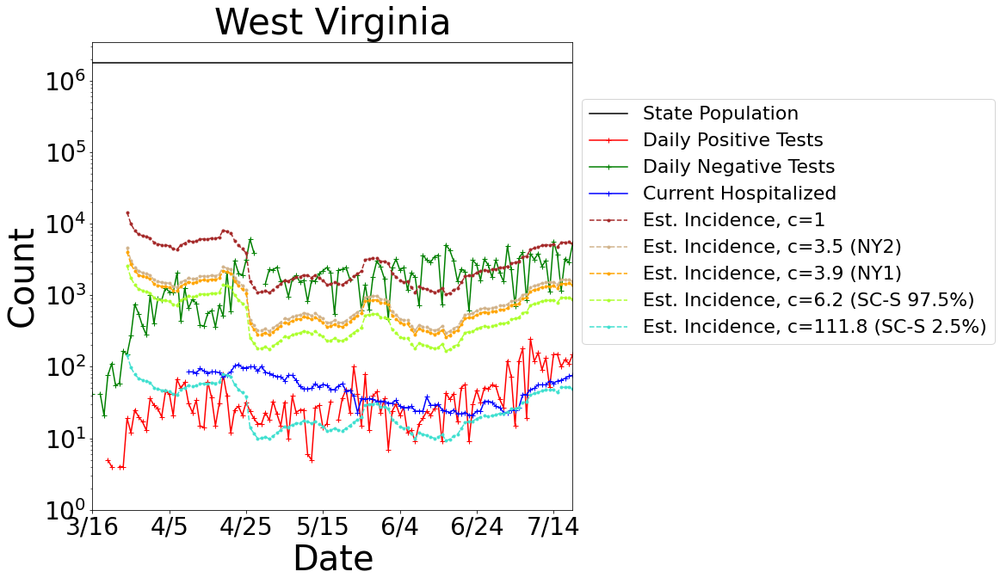

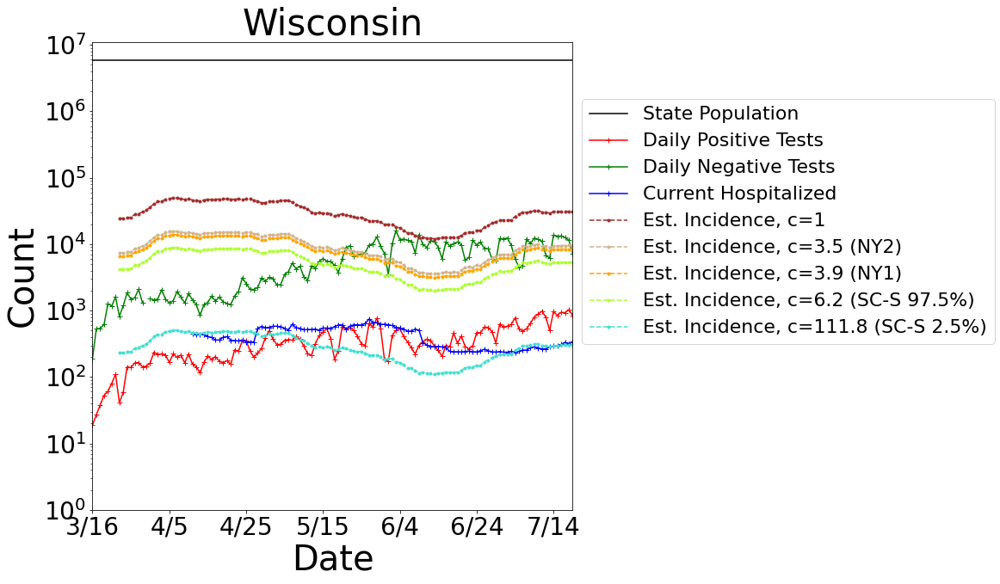

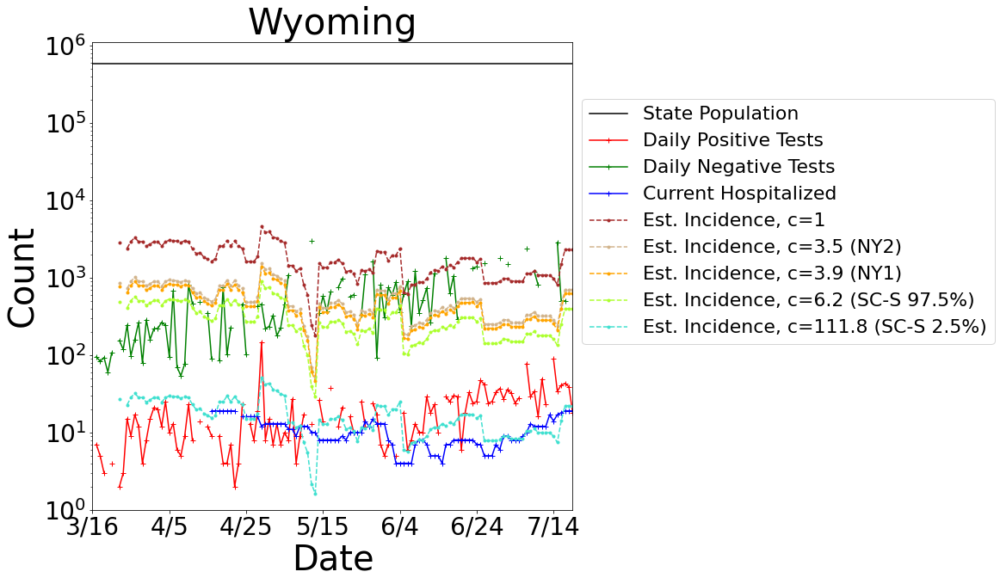

In [9]:
smoothing_len = 7
colors = ['brown', 'tan', 'orange', 'greenyellow', 'turquoise', 'blue', 'mediumvioletred', 'indigo']
def plot_for_cs(state, cs, save_dir, extension):
    plot_pos_neg_pop(state, dates)
    plt.title(state_full_names[state], fontsize=42)
    for i, (c_name, c_key) in enumerate(cs.items()):
        latent_totals = np.array([
            get_smoothed_latent(state, j, date, dates, c_key, smoothing_len)
                for j, date in enumerate(dates) if j >= smoothing_len]) 
        plt.errorbar(range(smoothing_len, len(dates)), latent_totals, #yerr=latent_stds,
                     color=colors[i], label='{}'.format(c_name), linestyle='--', marker=markers[0])
    finalize_plot(dates, "Count", "{}/{}.{}".format(save_dir, state, extension),
                  separate_legend=True, extension=extension, smoothing_len=smoothing_len)

for state in state_pops.keys():
    fig = plt.figure(figsize=(10, 10))
    plot_for_cs(state, {'Est. Incidence, c=1': 1, 
                        'Est. Incidence, c={:.1f} (NY2)'.format(c_ny2): c_ny2,
                        'Est. Incidence, c={:.1f} (NY1)'.format(c_ny1): c_ny1,
                        'Est. Incidence, c={:.1f} (SC-S 97.5%)'.format(c_scs_max): c_scs_max,
                        'Est. Incidence, c={:.1f} (SC-S 2.5%)'.format(c_scs_min): c_scs_min,
                },
               "results/",
               "png")

In [10]:
def get_rs_naive(state, begin_idx, mid_idx, end_idx):
    totals = np.array([
        get_positive(state, date) for j, date in enumerate(dates)])
    return np.mean(totals[mid_idx:end_idx]) / np.mean(totals[begin_idx:mid_idx])

In [11]:
def get_rs(state, cs, begin_idx, mid_idx, end_idx):
    for i, (c_name, c_key) in enumerate(cs.items()):
        latent_totals = np.array([
            get_smoothed_latent(state, j, date, dates, c_key)
                for j, date in enumerate(dates) if j > 6])
        ans = np.mean(latent_totals[mid_idx-6:end_idx-6]) / np.mean(latent_totals[begin_idx-6:mid_idx-6])
        if np.isfinite(ans):
            return ans
        else:
            return 0.

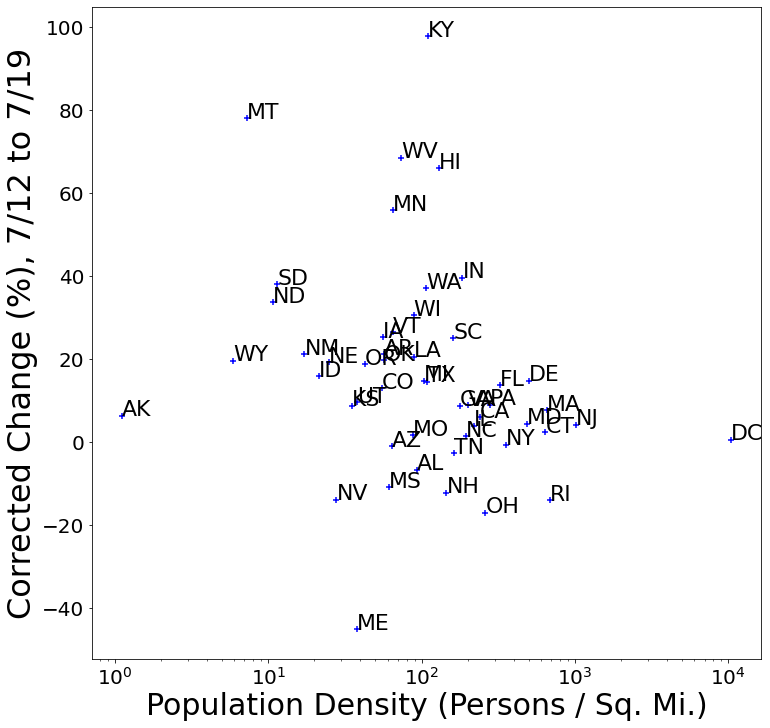

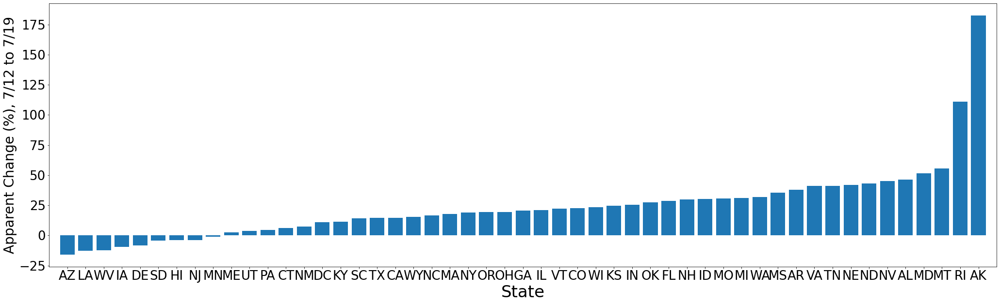

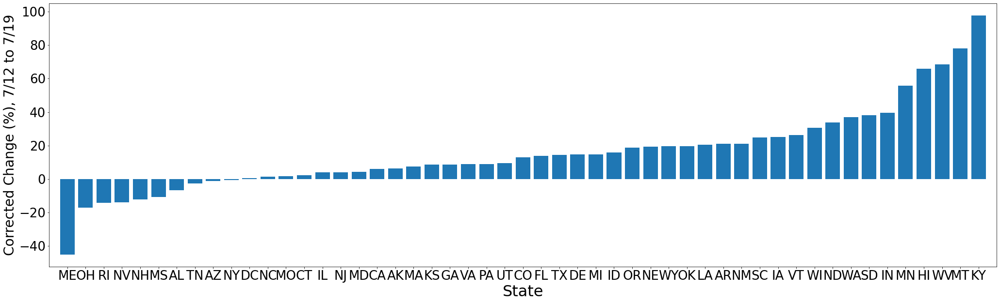

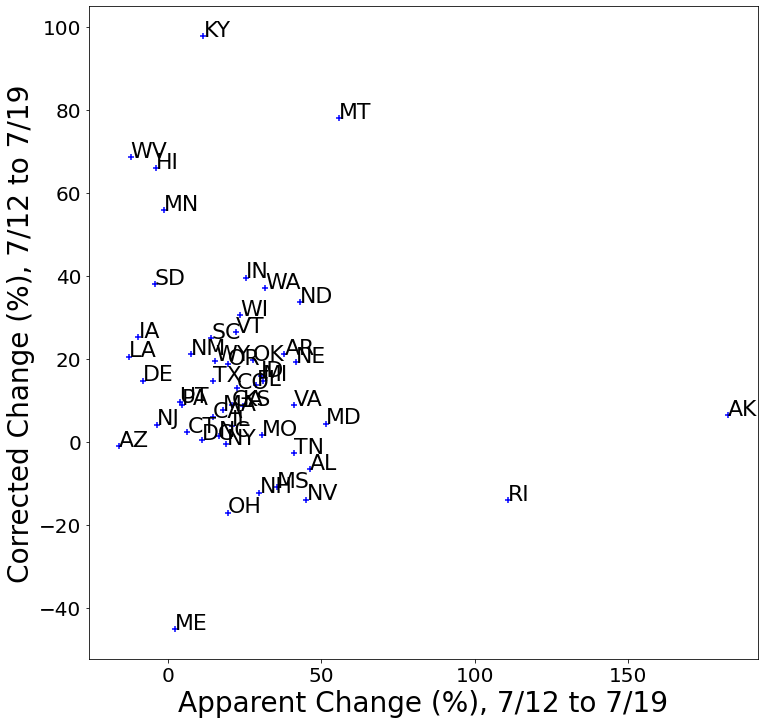

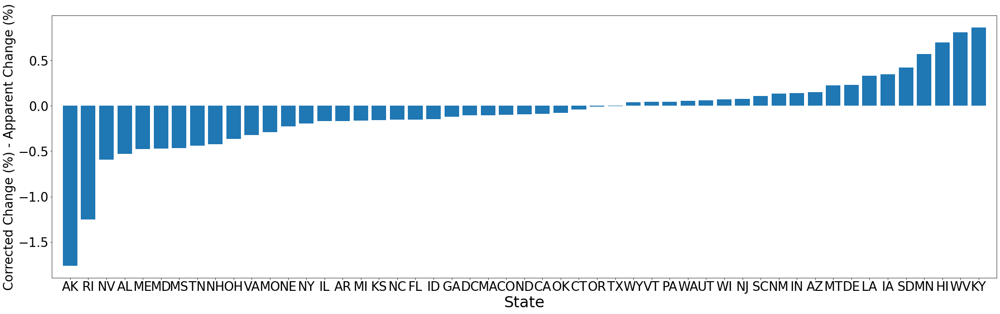

...

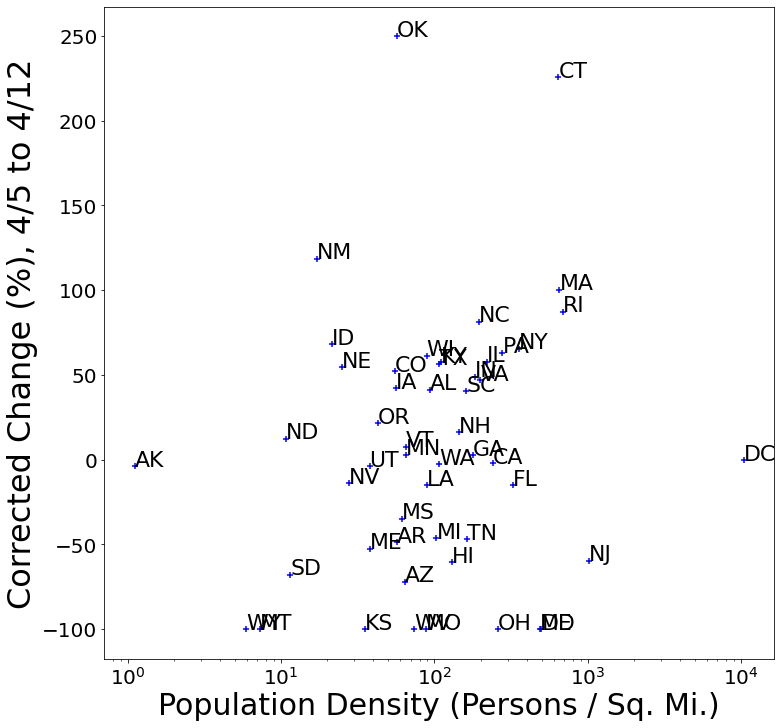

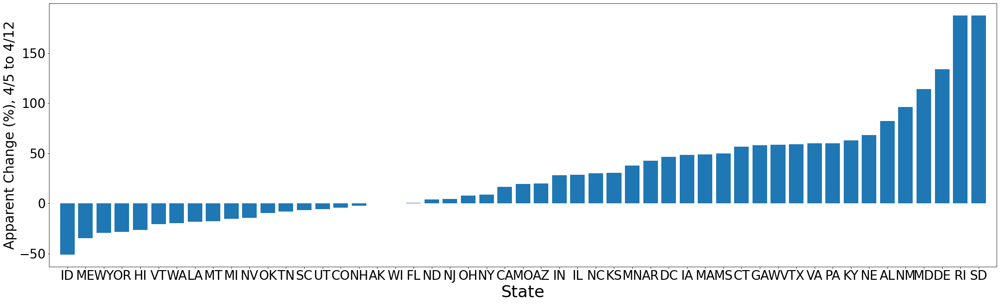

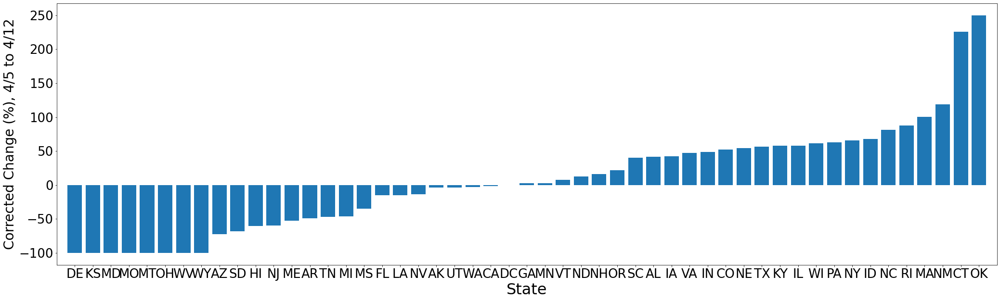

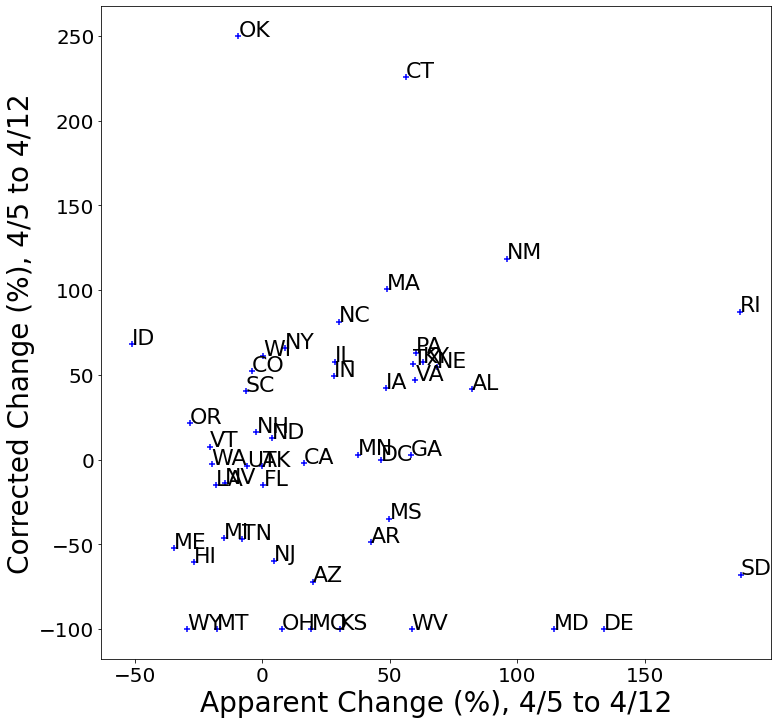

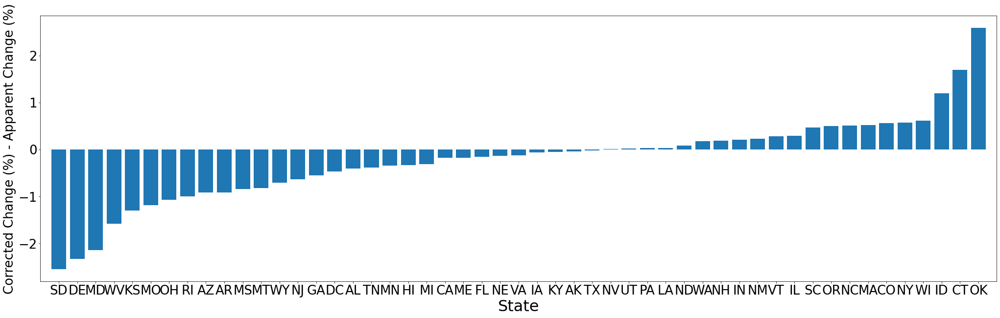

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Library/Frameworks/Python.framework/Versions/3

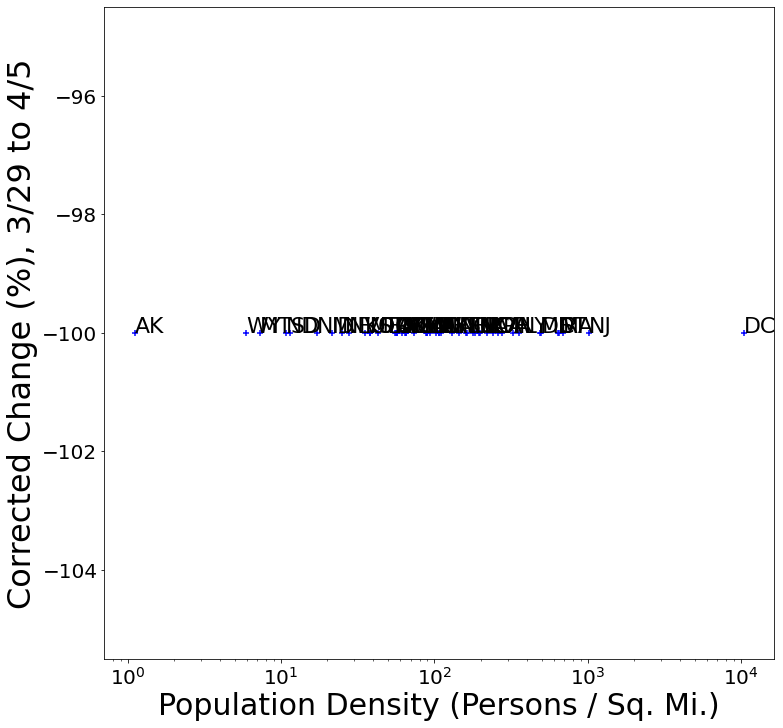

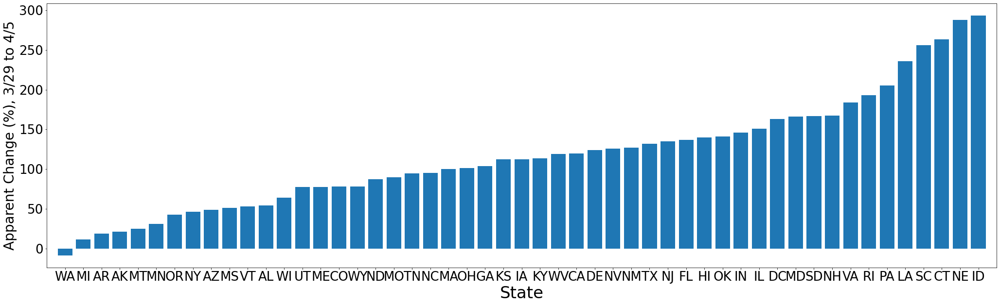

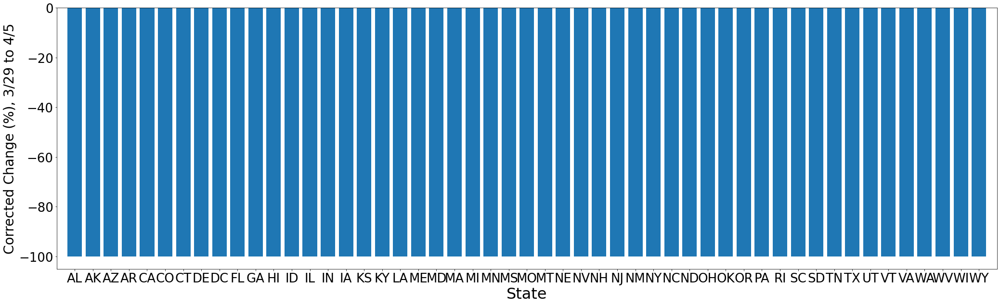

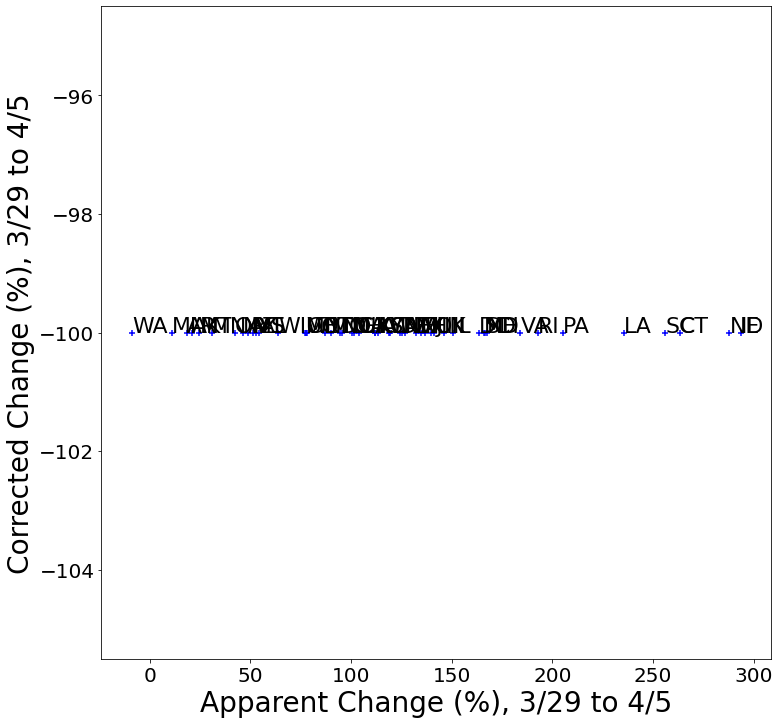

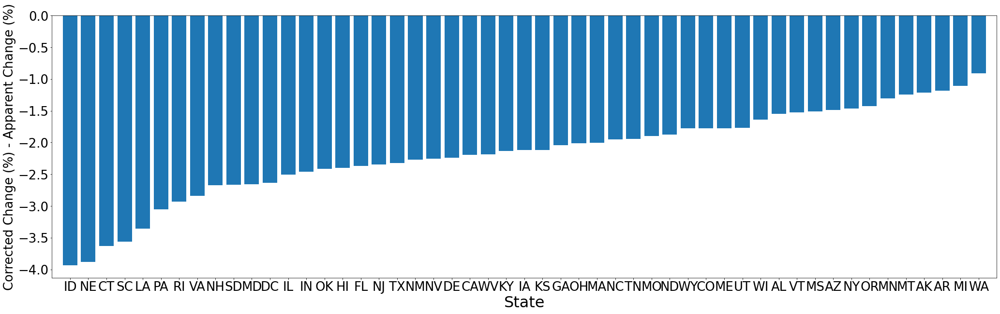

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Library/Frameworks/Python.framework/Versions/3

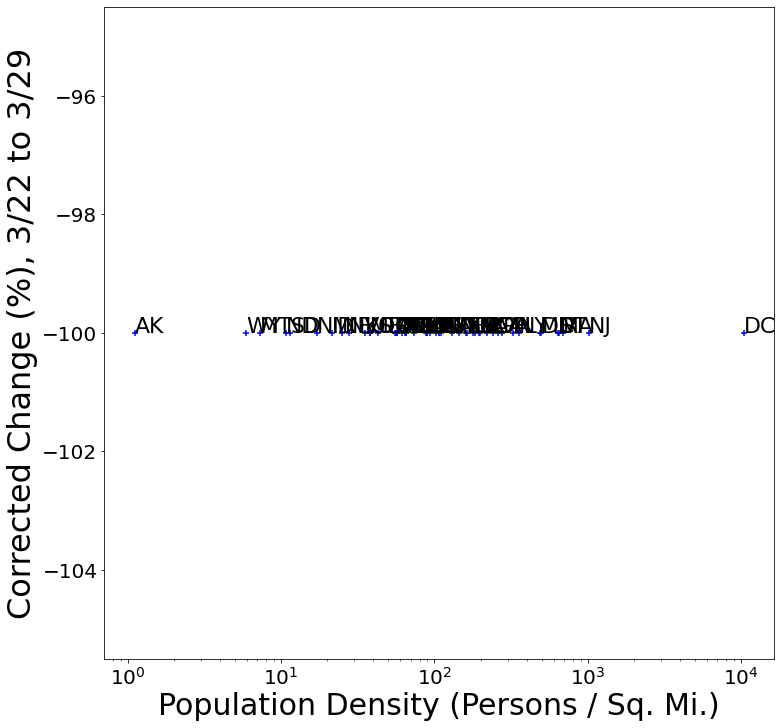

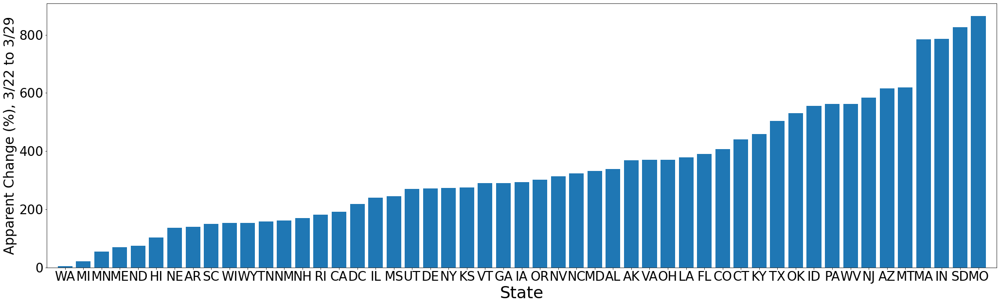

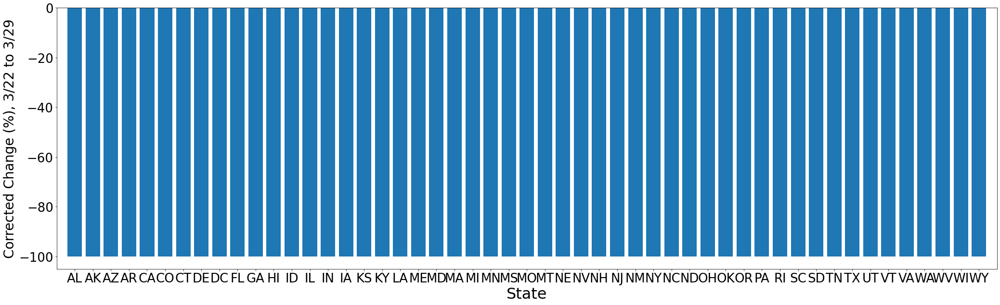

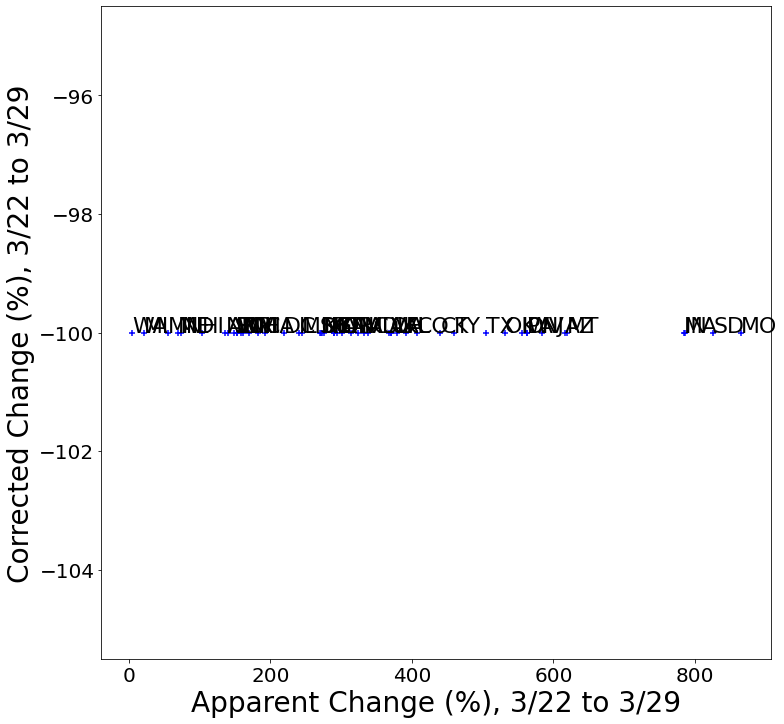

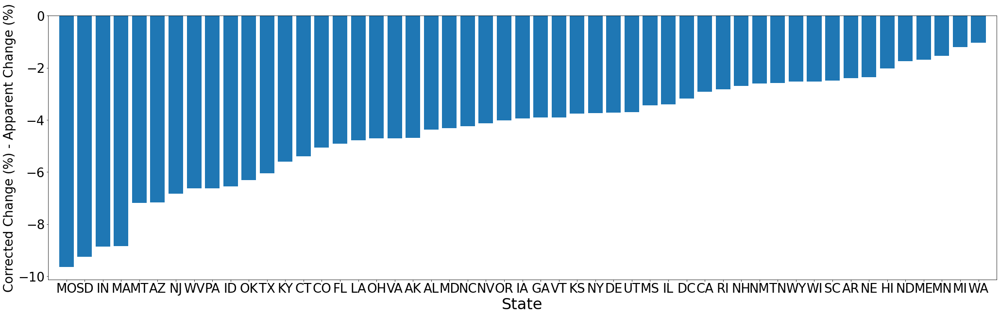

IndexError: list index out of range

In [12]:
from sklearn.linear_model import LinearRegression
import scipy
plt.rcParams.update({'font.size': 26,
                    'figure.max_open_warning': 200})

with open('results/rs.txt', 'w') as r_file:
    for week in range(len(dates) // 7):
        begin_idx = -((week+2)*7 + 1)
        mid_idx   = -((week+1)*7 + 1)
        end_idx   = -((week)*7 + 1)
        file_id   = "{}__{}".format(readable_dates[mid_idx].replace('/', '_'), readable_dates[end_idx].replace('/', '_'))
        title     = "{} to {}".format(readable_dates[mid_idx], readable_dates[end_idx])
        state_rs = {}

        plt.figure(figsize=(12, 12))
        data = np.zeros((len(state_pops.keys()), 2))
        for i, state in enumerate(state_pops.keys()):
            cur_r = get_rs(state, {'c={:.1f} (NY1)'.format(c_ny1): c_ny1}, begin_idx, mid_idx, end_idx)
            state_rs[state] = cur_r
            plt.scatter(state_pops[state]/state_sizes[state], cur_r*100 - 100, marker='+', color='blue')
            data[i, 0] = state_pops[state]/state_sizes[state]
            data[i, 1] = cur_r
            plt.annotate(state, (state_pops[state]/state_sizes[state], cur_r*100 - 100), fontsize=22)
        ax = plt.gca()
        ax.set_xscale('log')
        result = scipy.stats.spearmanr(data[:, 0], data[:, 1])
        print("{}  &   {:.2f} \\\\".format(title, result[0]), file=r_file)

        plt.xlabel("Population Density (Persons / Sq. Mi.)", fontsize=30)
        plt.ylabel("Corrected Change (%), {}".format(title), fontsize=32)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.savefig("results/weekly_change_{}.pdf".format(file_id), dpi=300)
        plt.show()

        state_rs_naive = {state: get_rs_naive(state, begin_idx, mid_idx, end_idx) for state in state_rs.keys()}
        states_by_r = [x[0] for x in sorted(list(state_rs_naive.items()), key=lambda x: x[1])]
        rs_in_order = [x[1] for x in sorted(list(state_rs_naive.items()), key=lambda x: x[1])]
        fig = plt.figure(figsize=(35, 10))
        plt.bar(states_by_r, 100*np.array(rs_in_order)-100)
        plt.xlabel("State", fontsize=34)
        plt.ylabel("Apparent Change (%), {}".format(title), fontsize=28)
        plt.xlim([-1, 51])
        plt.savefig("results/weekly_change_bar_naive_{}.pdf".format(file_id), dpi=300)
        plt.show()

        states_by_r = [x[0] for x in sorted(list(state_rs.items()), key=lambda x: x[1])]
        rs_in_order = [x[1] for x in sorted(list(state_rs.items()), key=lambda x: x[1])]
        fig = plt.figure(figsize=(35, 10))
        plt.bar(states_by_r, 100*np.array(rs_in_order)-100)
        plt.xlabel("State", fontsize=32)
        plt.ylabel("Corrected Change (%), {}".format(title), fontsize=28)
        plt.xlim([-1, 51])
        plt.savefig("results/weekly_change_bar_{}.pdf".format(file_id), dpi=300)
        plt.show()

        plt.figure(figsize=(12, 12))
        for state in state_rs.keys():
            plt.scatter(100*state_rs_naive[state]-100, 100*state_rs[state]-100, marker='+', color='blue')
            plt.annotate(state, (100*state_rs_naive[state]-100, 100*state_rs[state]-100), fontsize=22)
        plt.xlabel("Apparent Change (%), {}".format(title), fontsize=28)
        plt.ylabel("Corrected Change (%), {}".format(title), fontsize=28)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.savefig("results/weekly_apparent_vs_naive_{}.pdf".format(file_id), dpi=300)
        plt.show()
        plt.close()
        
        deltas = {state: state_rs[state] - state_rs_naive[state] for state in state_rs.keys()}
        states_by_delta = [x[0] for x in sorted(list(deltas.items()), key=lambda x: x[1])]
        deltas_in_order = [x[1] for x in sorted(list(deltas.items()), key=lambda x: x[1])]
        fig = plt.figure(figsize=(35, 10))
        plt.bar(states_by_delta, np.array(deltas_in_order))
        plt.xlabel("State", fontsize=32)
        plt.ylabel("Corrected Change (%) - Apparent Change (%)", fontsize=26)
        plt.xlim([-1, 51])
        plt.savefig("results/weekly_change_delta_bar_{}.pdf".format(file_id), dpi=300)
        plt.show()
        plt.close()

In [13]:
rs_df = pd.read_csv("results/rs.txt", sep=' ', header=None)
rs_df.head()

,0,1,2,3,4,5,6,7,8
0,7/12,to,7/19,NaN,&,NaN,NaN,-0.36,\\
1,7/5,to,7/12,NaN,&,NaN,NaN,-0.23,\\
2,6/28,to,7/5,NaN,&,NaN,NaN,-0.26,\\
3,6/21,to,6/28,NaN,&,NaN,NaN,-0.39,\\
4,6/14,to,6/21,NaN,&,NaN,NaN,-0.37,\\


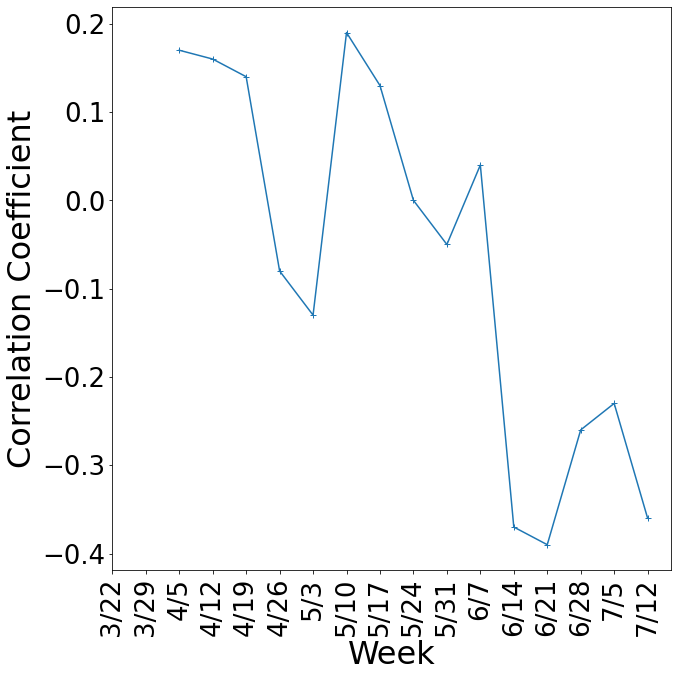

In [14]:
fig = plt.figure(figsize=(10, 10))
plt.plot(range(len(rs_df)), list(reversed(rs_df[7].values)), marker='+')
plt.xticks(range(len(rs_df)), labels=list(reversed(rs_df[0])), rotation=90)
plt.ylabel(r"Correlation Coefficient", fontsize=32)
plt.xlabel("Week", fontsize=32)
plt.tight_layout()
plt.savefig("results/corr_coefs_over_time.pdf", dpi=300)
plt.show()